## A project in music analysis, digital signal processing, machine learning etc. of William Basinski's _The Disintegration Loops_, starting with DLP 1.1

 1. Import file into python
 2. Analyze sound file, pull out a transformation
     1. identify repeating loop pattern
         - hidden markov models (for sequences), timeseries, temporal pattern recognition
         - a pattern that gets noisily/nonperfectly repeated in time
     1. identify first occurrence of this loop in the file, $X_0$
     1. difference between $X_0$ and $X_n$ succeeding loops
         - most explicit : all (forward in time) binary differences $X_n - X_{m},  m > n$
     1. derive transformation $T$ that maps $X_0$ to $X_1$, $X_1$ to $X_2$, etc. as closely as possible
         - lossy compression/transform? introduction of noise?
         - where are the qualitative changes in sound? e.g. distinct events in tape decay
             - a transform across the whole song?
             - a transform in each section between quali changes?
         - what is the relationship between physical disintegration process and the audio output? 
 3. Apply to input
     - recreate file
         - start with $X_0$
         - apply $T$ to $X_0$
         - compare what's generated, $X'_1$ to original loop $X_1$
         - compare for all $X'_n$, use "error" to refit $T$?
         - use other pieces from the disintegration loop as "test data" cf. above "training data"
     - recreate sample?
         - start with $X_0$
         - apply inverse of transformation $T^{-1}$ to $X_0$
         - does a coherent sound come out?
         - can we identify the sample?
             - parsons code for it
             - write a musical score of it?
                 - compare to orchestration from 9/11 10th anniv, or extract scores from below
                     - http://www.wqxr.org/story/153812-live-temple-dendur/
                     - https://soundcloud.com/maxim-moston/dlp-1-1-live-9-11-11-wordless
 4. convolve $T$ with other sounds
     - what does "disintegration" sound like for other songs?
         
is there a story with commuting diagrams?

$Y_0 \rightarrow Y_1$

$\uparrow \quad \quad\downarrow$

$X_0 \rightarrow X_1$ 

$X$ (original song) loop has some function evolving it noisily. $Y$ captures generic pattern and its evolution?

# Sources:
Audio analysis:
- vi hart on sound https://www.youtube.com/watch?v=i_0DXxNeaQ0
- Think DSP http://greenteapress.com/thinkdsp/html/index.html
- Short sound processing demo video for thinkDSP https://www.youtube.com/watch?v=0ALKGR0I5MA
- long (think)DSP video https://www.youtube.com/watch?v=UOIllEyajGs
- http://yaafe.sourceforge.net/
- https://en.wikipedia.org/wiki/Music_information_retrieval#Methods_used
- pyaudioanalysis http://journals.plos.org/plosone/article/file?id=10.1371/journal.pone.0144610&type=printable


Librosa:
- librosa tutorial https://librosa.github.io/librosa/tutorial.html
- https://github.com/librosa/tutorial/blob/master/Librosa%20tutorial.ipynb
- Audio effects and playback with Librosa and IPython Notebook https://github.com/librosa/librosa/blob/master/examples/LibROSA%20audio%20effects%20and%20playback.ipynb
- demo https://nbviewer.jupyter.org/github/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb
- librosa feature extraction https://librosa.github.io/librosa/feature.html#feature
- librosa feature extraction example https://www.kdnuggets.com/2016/09/urban-sound-classification-neural-networks-tensorflow.html/2
- http://musicinformationretrieval.com/ipython_audio.html
- https://github.com/tyiannak/pyAudioAnalysis/wiki/3.-Feature-Extraction
- https://www.youtube.com/watch?v=MhOdbtPhbLU SciPy 2015 Python audio tutorial
- librosa paper http://conference.scipy.org/proceedings/scipy2015/pdfs/brian_mcfee.pdf
- Python music software https://wiki.python.org/moin/PythonInMusic
- segmentation paper https://bmcfee.github.io/papers/ismir2014_spectral.pdf
    - and implementation https://librosa.github.io/librosa_gallery/auto_examples/plot_segmentation.html#sphx-glr-auto-examples-plot-segmentation-py
- librosa example gallery https://librosa.github.io/librosa_gallery/

Melodia (melody extraction?):
- https://github.com/justinsalamon/melodia_python_tutorial/blob/master/melodia_python_tutorial.ipynb

Vamp Plugins and "by hand" analysis (vamp plugins can be run in Jupyter)
- a list of plugins available http://www.vamp-plugins.org/download.html

Dependencies:
- librosa (https://librosa.github.io/librosa/)

    - docs https://librosa.github.io/librosa/

Animation:
- http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-notebooks/
- https://jakevdp.github.io/blog/2013/05/12/embedding-matplotlib-animations/

music information
- http://repmus.ircam.fr/music-information-geometry 
- 

# Import audio file


In [1]:
import librosa
import librosa.display
import IPython.display
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

from ipywidgets import widgets
from ipywidgets import interact,  Layout

In [2]:
#some basic functions
y,sr = librosa.core.load('dlp1_1.flac', mono=True, offset=0.0, duration=60) #, sr=44100, dtype=<class 'numpy.float32'>, res_type='kaiser_best'
y_h, y_p = librosa.effects.hpss(y)
# y_shift = librosa.effects.pitch_shift(y, sr, 7)
# y_slow = librosa.effects.time_stretch(y, 0.5)
# 

The above loads a clip of the song. Let's compare the clip with librosa's output after splitting percussive and harmonic components.

In [3]:
#a clip of the song
IPython.display.Audio(data=y, rate=sr)

In [4]:
# Play the percussive component
IPython.display.Audio(data=y_p, rate=sr)

In [5]:
# Play the harmopnic component
IPython.display.Audio(data=y_h, rate=sr)

The harmonic captures the interesting stuff--percussive seems like mostly *noise*? Definitely still contains the "crash" effect though


---
## Beat timings

Librosa has built-in functions for beat detection, but I doubt this will work with the percussive track since it's so irregular and noisy.

In [6]:
# from percussive
tempo, beat_frames = librosa.beat.beat_track(y=y_p, sr=sr)
beat_times = librosa.frames_to_time(beat_frames, sr=sr)
librosa.output.times_csv('P_beat_frames_to_times.csv', beat_times)

# #from harmonic?
# tempo, beat_frames = librosa.beat.beat_track(y=y_h, sr=sr)
# beat_times = librosa.frames_to_time(beat_frames, sr=sr)
# librosa.output.times_csv('H_beat_frames_to_times.csv', beat_times)

# #from raw
# tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)
# beat_times = librosa.frames_to_time(beat_frames, sr=sr)
# librosa.output.times_csv('Y_beat_frames_to_times.csv', beat_times)



## Component isolation

Most of the following adapts the Librosa tutorial or related guides

In [7]:
# Decompose a spectrogram with NMF, and then resynthesize an individual component
D = librosa.stft(y)
# Separate the magnitude and phase
S, phase = librosa.magphase(D)
# decompose
components, activations = librosa.decompose.decompose(S, n_components=8, sort=True)

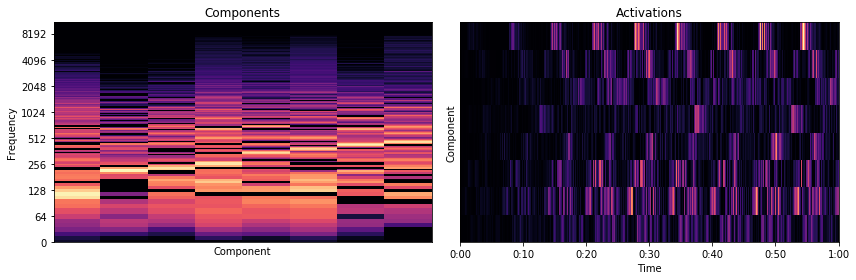

In [8]:
# Visualize the components and activations, just for fun

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(components, ref=np.max), y_axis='log')
plt.xlabel('Component')
plt.ylabel('Frequency')
plt.title('Components')

plt.subplot(1,2,2)
librosa.display.specshow(activations, x_axis='time')
plt.xlabel('Time')
plt.ylabel('Component')
plt.title('Activations')

plt.tight_layout()

The components don't look super distinct, but the activations clearly show the pattern of the loop! Now reconstruct the original clip from the components we've separated.

In [9]:
# Play back the reconstruction
# Reconstruct a spectrogram by the outer product of component k and its activation
D_k = components.dot(activations)

# invert the stft after putting the phase back in
y_k = librosa.istft(D_k * phase)

# And playback
print('Full reconstruction')

IPython.display.Audio(data=y_k, rate=sr)

Full reconstruction


The fidelity could be improved by decomposing into a greater number of components.

Play a sample component:

In [10]:
k = 2

# Reconstruct a spectrogram by the outer product of component k and its activation
D_k = np.multiply.outer(components[:, k], activations[k])

# invert the stft after putting the phase back in
y_k = librosa.istft(D_k * phase)

# And playback
print('Component #{}'.format(k))

IPython.display.Audio(data=y_k, rate=sr)

Component #2


Noisy, but it does seem to be have periodic intensity...

# Librosa demo -- source of most of the below
https://nbviewer.jupyter.org/github/librosa/librosa/blob/master/examples/LibROSA%20demo.ipynb



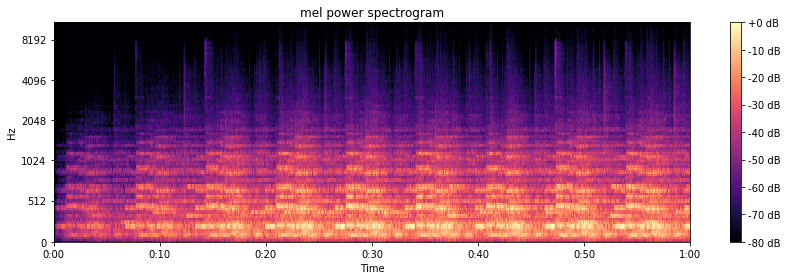

In [11]:
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

In [12]:
mfcc = librosa.feature.mfcc(y=y, sr=sr)

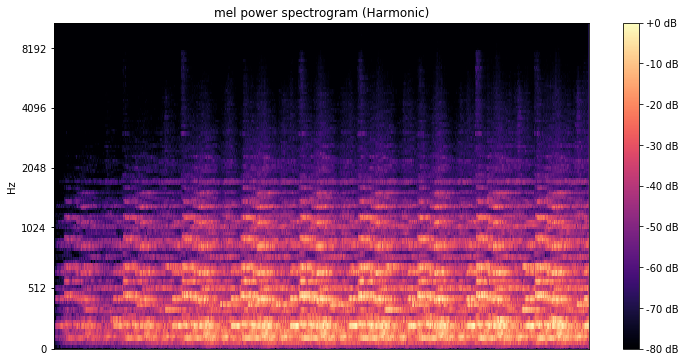

In [13]:
# What do the spectrograms look like?
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S_harmonic   = librosa.feature.melspectrogram(y_h, sr=sr)
S_percussive = librosa.feature.melspectrogram(y_p, sr=sr)

# Convert to log scale (dB). We'll use the peak power as reference.
log_Sh = librosa.power_to_db(S_harmonic, ref=np.max)
log_Sp = librosa.power_to_db(S_percussive, ref=np.max)

# Make a new figure
plt.figure(figsize=(12,6))

# plt.subplot(2,1,1)
# Display the spectrogram on a mel scale
librosa.display.specshow(log_Sh, sr=sr, y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram (Harmonic)')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# plt.subplot(2,1,2)
# librosa.display.specshow(log_Sp, sr=sr, x_axis='time', y_axis='mel')

# # Put a descriptive title on the plot
# plt.title('mel power spectrogram (Percussive)')

# # draw a color bar
# plt.colorbar(format='%+02.0f dB')

# # Make the figure layout compact
# plt.tight_layout()

Note: Mel scale has distance equalized for successive pitches people hear, which is not linear.

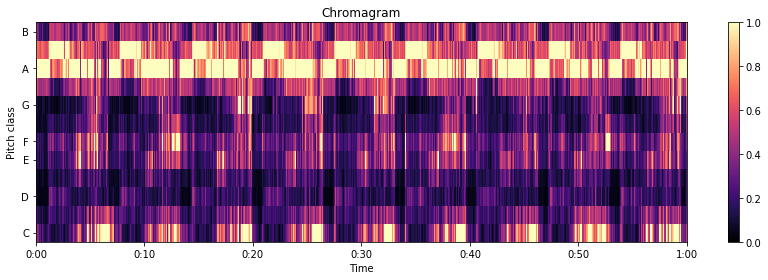

In [14]:
# We'll use a CQT-based chromagram here.  An STFT-based implementation also exists in chroma_cqt()
# We'll use the harmonic component to avoid pollution from transients
C = librosa.feature.chroma_cqt(y=y_h, sr=sr)

# Make a new figure
plt.figure(figsize=(12,4))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()

This captures what notes are "playing"! I tapped this out on piano -- the notes are right, the timing still difficult to tell with the noise in the original track

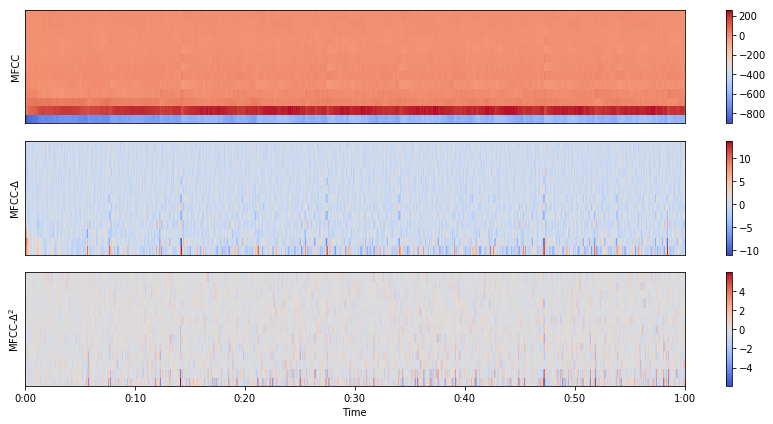

In [15]:
# Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)

# Let's pad on the first and second deltas while we're at it
delta_mfcc  = librosa.feature.delta(mfcc)
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

# How do they look?  We'll show each in its own subplot
plt.figure(figsize=(12, 6))

plt.subplot(3,1,1)
librosa.display.specshow(mfcc)
plt.ylabel('MFCC')
plt.colorbar()

plt.subplot(3,1,2)
librosa.display.specshow(delta_mfcc)
plt.ylabel('MFCC-$\Delta$')
plt.colorbar()

plt.subplot(3,1,3)
librosa.display.specshow(delta2_mfcc, sr=sr, x_axis='time')
plt.ylabel('MFCC-$\Delta^2$')
plt.colorbar()

plt.tight_layout()

# For future use, we'll stack these together into one matrix
M = np.vstack([mfcc, delta_mfcc, delta2_mfcc])

# Librosa tutorial
https://librosa.github.io/librosa/tutorial.html

In [16]:
# 
# Feature extraction example
import numpy as np
import librosa

# Load the example clip
# y, sr = librosa.load(librosa.util.example_audio_file())

# Set the hop length; at 22050 Hz, 512 samples ~= 23ms
hop_length = 512

# Separate harmonics and percussives into two waveforms
y_harmonic, y_percussive = librosa.effects.hpss(y)

# Beat track on the percussive signal
tempo, beat_frames = librosa.beat.beat_track(y=y_percussive,
                                             sr=sr)

# Compute MFCC features from the raw signal
mfcc = librosa.feature.mfcc(y=y, sr=sr, hop_length=hop_length, n_mfcc=13)

# And the first-order differences (delta features)
mfcc_delta = librosa.feature.delta(mfcc)

# Stack and synchronize between beat events
# This time, we'll use the mean value (default) instead of median
beat_mfcc_delta = librosa.util.sync(np.vstack([mfcc, mfcc_delta]),
                                    beat_frames)

# Compute chroma features from the harmonic signal
chromagram = librosa.feature.chroma_cqt(y=y_harmonic,
                                        sr=sr)

# Aggregate chroma features between beat events
# We'll use the median value of each feature between beat frames
beat_chroma = librosa.util.sync(chromagram,
                                beat_frames,
                                aggregate=np.median)

# Finally, stack all beat-synchronous features together
beat_features = np.vstack([beat_chroma, beat_mfcc_delta])

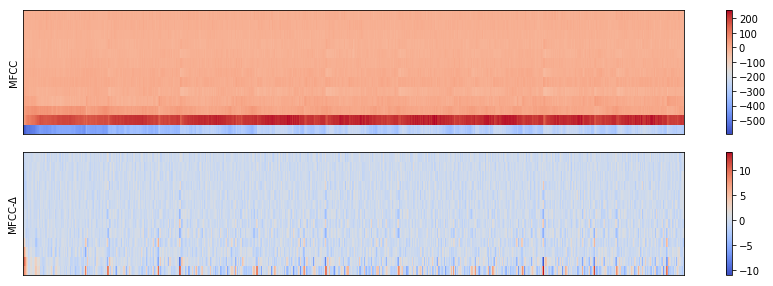

In [17]:
# How do they look?  We'll show each in its own subplot
plt.figure(figsize=(12, 6))

plt.subplot(3,1,1)
librosa.display.specshow(mfcc)
plt.ylabel('MFCC')
plt.colorbar()

plt.subplot(3,1,2)
librosa.display.specshow(delta_mfcc)
plt.ylabel('MFCC-$\Delta$')
plt.colorbar()

plt.tight_layout()


# To do?
- isolate loops
    - use component that isolates the main note?
    - some other periodic component
    - how to verify?
- find components of each loop
- track changes between components across loops